In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
import matplotlib.lines as mlines
import seaborn as sns
import warnings
import miceforest as mf
from joblib import dump, load

from miceforest import ImputationKernel
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.impute import KNNImputer, SimpleImputer
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import LinearSVC, SVC
from sklearn.model_selection import GridSearchCV, KFold, StratifiedShuffleSplit
from sklearn.metrics import f1_score, accuracy_score, precision_score, recall_score, classification_report, roc_curve, auc
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from imblearn.over_sampling import SMOTE
from imblearn.combine import SMOTETomek
from imblearn.under_sampling import RandomUnderSampler
from sklearn.calibration import CalibratedClassifierCV

from sklearn.exceptions import DataConversionWarning, FitFailedWarning, ConvergenceWarning

In [2]:

path = 'data/weatherAUS.csv'


data = pd.read_csv(path,sep=',')
data.drop_duplicates(inplace=True)

#drop rows with null in target column
data.dropna(subset=['RainTomorrow'], inplace=True)

data.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


Lets see how much data is missing.

In [3]:
null_counts_per_row = data.isnull().sum(axis=1)
count_of_nulls = null_counts_per_row.value_counts(sort=True)
print(count_of_nulls)

0     56420
4     28540
2     18033
1     10765
6      9938
3      9611
5      3642
7      1801
8       964
12      757
11      679
9       394
10      290
13      106
17       91
18       49
14       39
16       27
15       26
19       16
20        5
Name: count, dtype: int64


Okay, we have 22 feature columns so it might make sense to drop the rows where more than half is missing (so about 3000 rows - not a tragedy considering that dataset has about 145 000).

In [4]:
missing_percentage = (data.isnull().sum() / len(data)) * 100
print(missing_percentage)

Date              0.000000
Location          0.000000
MinTemp           0.447983
MaxTemp           0.226453
Rainfall          0.988797
Evaporation      42.789026
Sunshine         47.692924
WindGustDir       6.561504
WindGustSpeed     6.519308
WindDir9am        7.041838
WindDir3pm        2.656952
WindSpeed9am      0.948007
WindSpeed3pm      1.849599
Humidity9am       1.247600
Humidity3pm       2.538803
Pressure9am       9.855619
Pressure3pm       9.832411
Cloud9am         37.735332
Cloud3pm         40.152469
Temp9am           0.635756
Temp3pm           1.917113
RainToday         0.988797
RainTomorrow      0.000000
dtype: float64


Evaporation, Sunshine, Cloud3am and Cloud9am have huge percent of missing values. We'll adress this issue later when well see how much information about the target they bring to the table

In [5]:
data[['Year','Month', 'Day']] = data['Date'].str.split('-', expand=True)
data.drop(columns=['Day','Date'], inplace=True)

# Converting columns to numeric
#data['Year'] = pd.to_numeric(data['Year'], errors='coerce', downcast='integer')
data['Month'] = pd.to_numeric(data['Month'], errors='coerce', downcast='integer')

month_names = {
    1: 'January',
    2: 'February',
    3: 'March',
    4: 'April',
    5: 'May',
    6: 'June',
    7: 'July',
    8: 'August',
    9: 'September',
    10: 'October',
    11: 'November',
    12: 'December'
}

data['Month'] = data['Month'].map(month_names)

columns = list(data.columns)
columns.insert(0, columns.pop(columns.index('Month')))
columns.insert(0, columns.pop(columns.index('Year')))
data = data[columns]
data.head()

,Year,Month,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008,December,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008,December,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008,December,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008,December,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008,December,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [6]:
for column in columns:
    print(column, ':    ', data[column].unique()[:10])

Year :     ['2008' '2009' '2010' '2011' '2012' '2013' '2014' '2015' '2016' '2017']
Month :     ['December' 'January' 'February' 'March' 'April' 'May' 'June' 'July'
 'August' 'September']
Location :     ['Albury' 'BadgerysCreek' 'Cobar' 'CoffsHarbour' 'Moree' 'Newcastle'
 'NorahHead' 'NorfolkIsland' 'Penrith' 'Richmond']
MinTemp :     [13.4  7.4 12.9  9.2 17.5 14.6 14.3  7.7  9.7 13.1]
MaxTemp :     [22.9 25.1 25.7 28.  32.3 29.7 25.  26.7 31.9 30.1]
Rainfall :     [ 0.6  0.   1.   0.2  1.4  2.2 15.6  3.6  nan 16.8]
Evaporation :     [ nan 12.  14.8 12.6 10.8 11.4 11.2 13.   9.8 14.6]
Sunshine :     [ nan 12.3 13.  13.3 10.6 12.2  8.4  0.  12.6 13.2]
WindGustDir :     ['W' 'WNW' 'WSW' 'NE' 'NNW' 'N' 'NNE' 'SW' 'ENE' 'SSE']
WindGustSpeed :     [44. 46. 24. 41. 56. 50. 35. 80. 28. 30.]
WindDir9am :     ['W' 'NNW' 'SE' 'ENE' 'SW' 'SSE' 'S' 'NE' nan 'SSW']
WindDir3pm :     ['WNW' 'WSW' 'E' 'NW' 'W' 'SSE' 'ESE' 'ENE' 'NNW' 'SSW']
WindSpeed9am :     [20.  4. 19. 11.  7.  6. 15. 17. 28. 24.]
W

In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 142193 entries, 0 to 145458
Data columns (total 24 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Year           142193 non-null  object 
 1   Month          142193 non-null  object 
 2   Location       142193 non-null  object 
 3   MinTemp        141556 non-null  float64
 4   MaxTemp        141871 non-null  float64
 5   Rainfall       140787 non-null  float64
 6   Evaporation    81350 non-null   float64
 7   Sunshine       74377 non-null   float64
 8   WindGustDir    132863 non-null  object 
 9   WindGustSpeed  132923 non-null  float64
 10  WindDir9am     132180 non-null  object 
 11  WindDir3pm     138415 non-null  object 
 12  WindSpeed9am   140845 non-null  float64
 13  WindSpeed3pm   139563 non-null  float64
 14  Humidity9am    140419 non-null  float64
 15  Humidity3pm    138583 non-null  float64
 16  Pressure9am    128179 non-null  float64
 17  Pressure3pm    128212 non-null  fl

In [8]:
categorical_columns = data.select_dtypes(include=['int16','object', 'category']).columns.to_numpy()
numerical_columns = data.select_dtypes(include=['int64', 'float64']).columns.to_numpy()

#numerical_columns = numerical_columns[numerical_columns != 'Cloud9am']
#numerical_columns = numerical_columns[numerical_columns != 'Cloud3pm']
#categorical_columns = np.append('Cloud9am', categorical_columns)
#categorical_columns = np.append('Cloud3pm', categorical_columns)
#numerical_columns = numerical_columns[numerical_columns != 'C6H6(GT)']

print(categorical_columns)
print(numerical_columns)

['Year' 'Month' 'Location' 'WindGustDir' 'WindDir9am' 'WindDir3pm'
 'RainToday' 'RainTomorrow']
['MinTemp' 'MaxTemp' 'Rainfall' 'Evaporation' 'Sunshine' 'WindGustSpeed'
 'WindSpeed9am' 'WindSpeed3pm' 'Humidity9am' 'Humidity3pm' 'Pressure9am'
 'Pressure3pm' 'Cloud9am' 'Cloud3pm' 'Temp9am' 'Temp3pm']


# EDA

## <p style="font-size:30px">1. Univariate analysis</p> 

Lets plot some histograms for numerical features:

array([[<Axes: title={'center': 'MinTemp'}>,
        <Axes: title={'center': 'MaxTemp'}>,
        <Axes: title={'center': 'Rainfall'}>,
        <Axes: title={'center': 'Evaporation'}>],
       [<Axes: title={'center': 'Sunshine'}>,
        <Axes: title={'center': 'WindGustSpeed'}>,
        <Axes: title={'center': 'WindSpeed9am'}>,
        <Axes: title={'center': 'WindSpeed3pm'}>],
       [<Axes: title={'center': 'Humidity9am'}>,
        <Axes: title={'center': 'Humidity3pm'}>,
        <Axes: title={'center': 'Pressure9am'}>,
        <Axes: title={'center': 'Pressure3pm'}>],
       [<Axes: title={'center': 'Cloud9am'}>,
        <Axes: title={'center': 'Cloud3pm'}>,
        <Axes: title={'center': 'Temp9am'}>,
        <Axes: title={'center': 'Temp3pm'}>]], dtype=object)

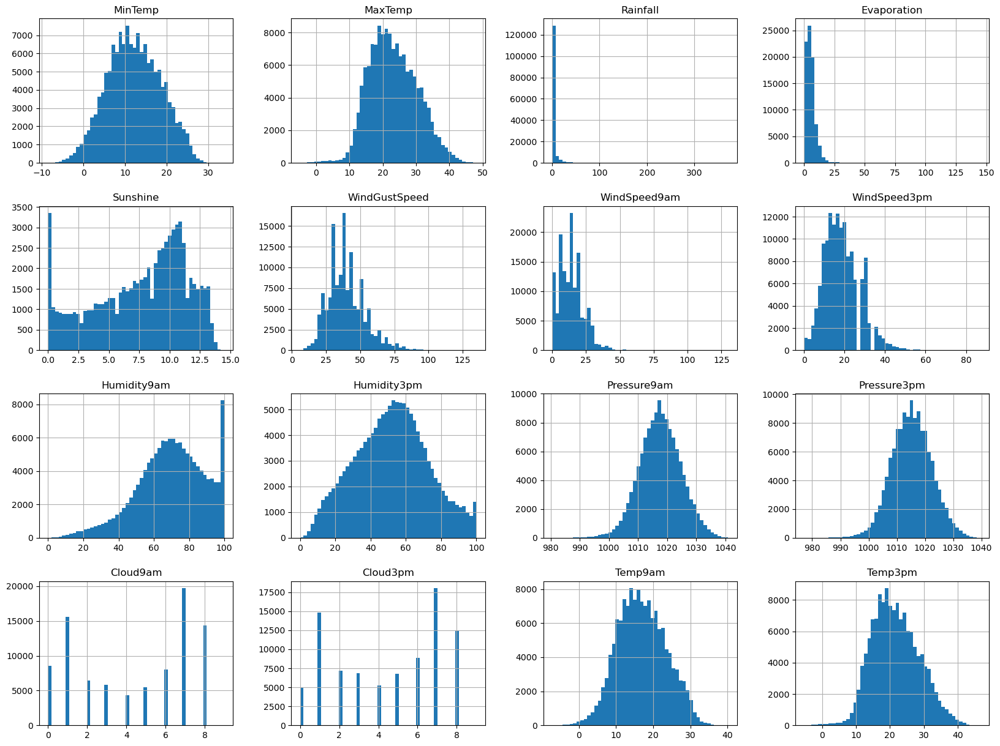

In [9]:
data[numerical_columns].hist(bins=50, figsize=(20,15)) #

And now for categorical columns

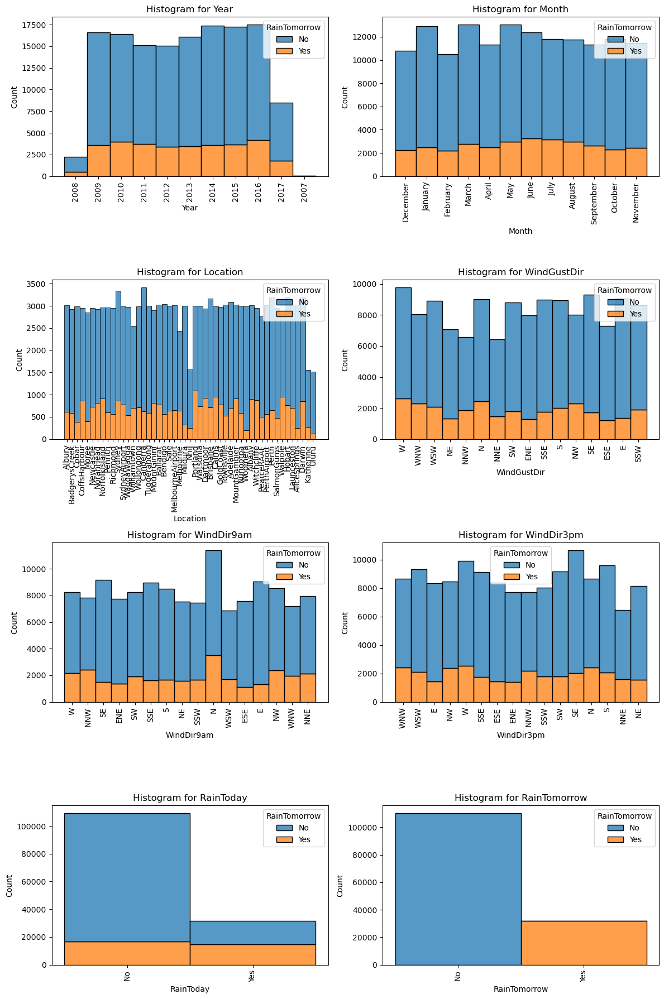

In [10]:
warnings.filterwarnings("ignore", category=FutureWarning)

fig, ax = plt.subplots(nrows=(len(categorical_columns))//2,ncols=2,figsize=(12,18))

for i, column in enumerate(categorical_columns):#(data.columns.tolist()):

    row = i // 2
    col = i % 2


    #sns.barplot(data=data, x=column, y='y', estimator='count', ax=ax[row,col])
    sns.histplot(data=data, x=column, hue='RainTomorrow', multiple='stack', ax=ax[row,col])
    ax[row,col].set_title(f'Histogram for {column}')
    ax[row,col].tick_params(axis='x', rotation=90)

    
plt.tight_layout()
plt.show()

Okay we can clearly see that we are dealing with a target class 'No' overrepresented in comparison to 'Yes' (about 3 times more 'No' instances). Other than that we se that 'RainToday' is quite correlated with target.

In [11]:
data[numerical_columns].describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,141556.000000,141871.000000,140787.000000,81350.000000,74377.000000,132923.000000,140845.000000,139563.000000,140419.000000,138583.000000,128179.000000,128212.000000,88536.000000,85099.000000,141289.000000,139467.000000
mean,12.186400,23.226784,2.349974,5.469824,7.624853,39.984292,14.001988,18.637576,68.843810,51.482606,1017.653758,1015.258204,4.437189,4.503167,16.987509,21.687235
std,6.403283,7.117618,8.465173,4.188537,3.781525,13.588801,8.893337,8.803345,19.051293,20.797772,7.105476,7.036677,2.887016,2.720633,6.492838,6.937594
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.500000,977.100000,0.000000,0.000000,-7.200000,-5.400000
25%,7.600000,17.900000,0.000000,2.600000,4.900000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.900000,1010.400000,1.000000,2.000000,12.300000,16.600000
50%,12.000000,22.600000,0.000000,4.800000,8.500000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.600000,1015.200000,5.000000,5.000000,16.700000,21.100000
75%,16.800000,28.200000,0.800000,7.400000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.400000,1020.000000,7.000000,7.000000,21.600000,26.400000
max,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.000000,1039.600000,9.000000,9.000000,40.200000,46.700000


We can see that we have pretty big problem with outliers for Evaporation and Rainfall as well as WindSpeed.

## <p style="font-size:30px"> 2. Multivariate analysis: consider features in pairs, try to introduce new features to consider their relationship with other features, correlation</p> 

First, lets inspect numerical values and plot correlation matrix of numerical features as a heatmap:

[[ 1.    0.74  0.1   0.47  0.07  0.18  0.18  0.18 -0.23  0.01 -0.45 -0.46
   0.08  0.02  0.9   0.71  0.08]
 [ 0.74  1.   -0.07  0.59  0.47  0.07  0.01  0.05 -0.51 -0.51 -0.33 -0.43
  -0.29 -0.28  0.89  0.98 -0.16]
 [ 0.1  -0.07  1.   -0.06 -0.23  0.13  0.09  0.06  0.22  0.26 -0.17 -0.13
   0.2   0.17  0.01 -0.08  0.24]
 [ 0.47  0.59 -0.06  1.    0.37  0.2   0.19  0.13 -0.51 -0.39 -0.27 -0.29
  -0.19 -0.18  0.55  0.57 -0.12]
 [ 0.07  0.47 -0.23  0.37  1.   -0.03  0.01  0.06 -0.49 -0.63  0.04 -0.02
  -0.68 -0.7   0.29  0.49 -0.45]
 [ 0.18  0.07  0.13  0.2  -0.03  1.    0.6   0.69 -0.22 -0.03 -0.46 -0.41
   0.07  0.11  0.15  0.03  0.23]
 [ 0.18  0.01  0.09  0.19  0.01  0.6   1.    0.52 -0.27 -0.03 -0.23 -0.17
   0.02  0.05  0.13  0.01  0.09]
 [ 0.18  0.05  0.06  0.13  0.06  0.69  0.52  1.   -0.15  0.02 -0.3  -0.25
   0.05  0.03  0.16  0.03  0.09]
 [-0.23 -0.51  0.22 -0.51 -0.49 -0.22 -0.27 -0.15  1.    0.67  0.14  0.19
   0.45  0.36 -0.47 -0.5   0.26]
 [ 0.01 -0.51  0.26 -0.39 -0.63 -0.03

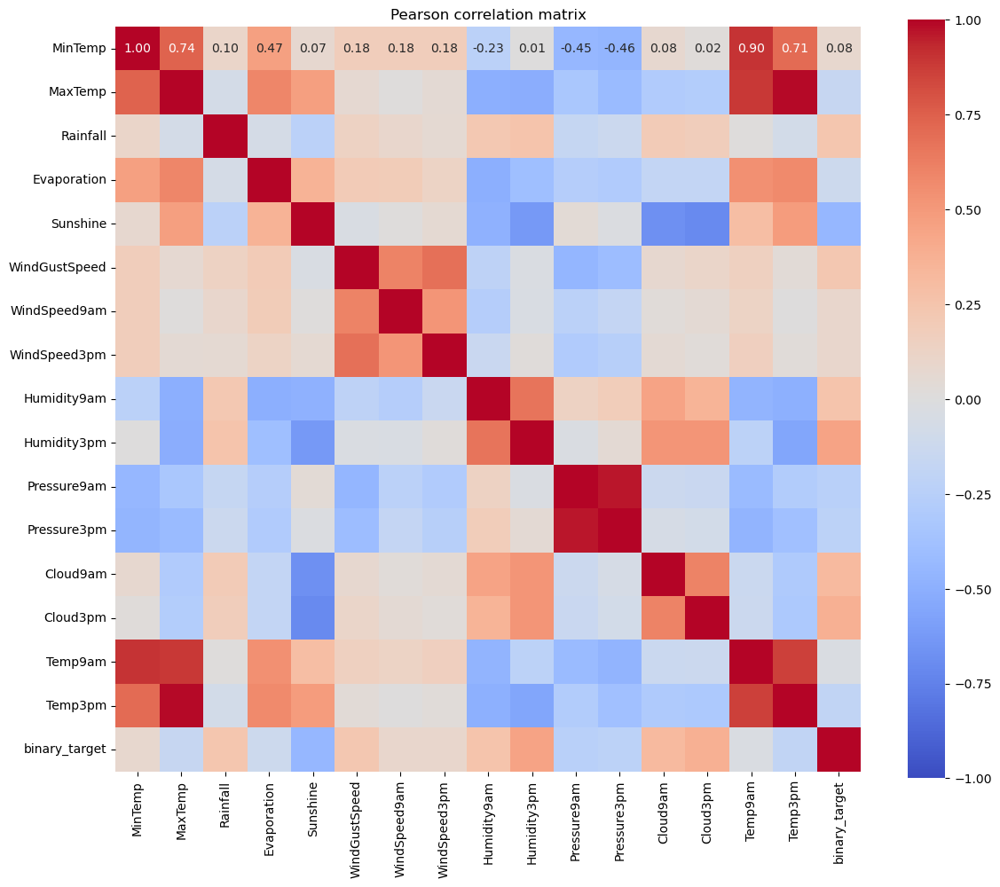

In [12]:
plt.figure(figsize=(12, 10))
data['binary_target'] = data['RainTomorrow'].map(lambda x: 1 if x == 'Yes' else 0)

cor = data[list(numerical_columns) + ['binary_target']].corr()
sns.heatmap(cor, cmap="coolwarm", vmin=-1, vmax=1, fmt=".2f",annot=True, square=True)
plt.title("Pearson correlation matrix")
plt.tight_layout()
data.drop(columns='binary_target', inplace=True)
#plt.show()
print(np.round(cor.to_numpy(), 2))

And print explicitly correlations between features and target:

In [13]:
cor['binary_target'].sort_values(ascending=False)

binary_target    1.000000
Humidity3pm      0.446160
Cloud3pm         0.381870
Cloud9am         0.317380
Humidity9am      0.257161
Rainfall         0.239032
WindGustSpeed    0.234010
WindSpeed9am     0.090995
WindSpeed3pm     0.087817
MinTemp          0.083936
Temp9am         -0.025691
Evaporation     -0.119285
MaxTemp         -0.159237
Temp3pm         -0.192424
Pressure3pm     -0.226031
Pressure9am     -0.246371
Sunshine        -0.450768
Name: binary_target, dtype: float64

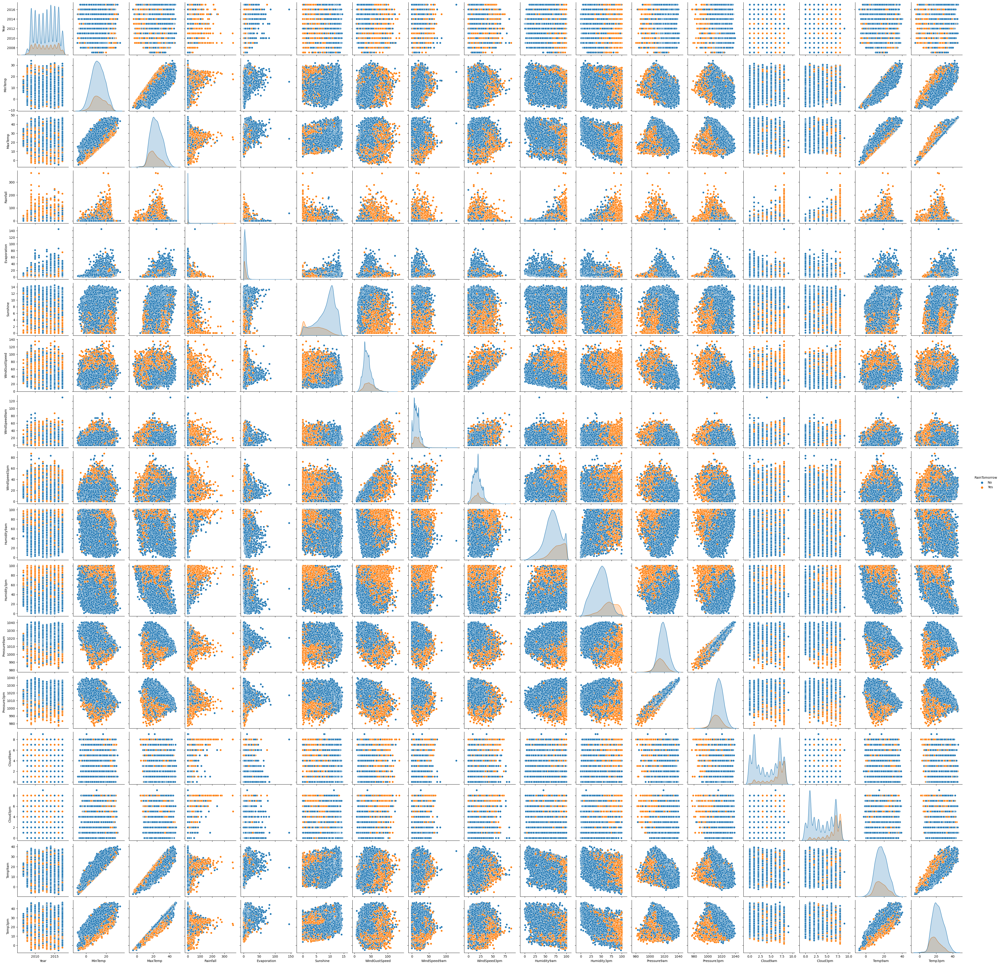

In [27]:
#sns.pairplot(data, hue='RainTomorrow')

It definitely took a while to compute but it has given us a lot of insight into a data. For example we see that temperature based features are highly correlated as well as pressure.

# Data Preparation 

Here we will prepare data for the model. We have already done some feature engineering ('Date' with 'Year' and 'Month')
<br>
<br>
Now we need to:
<br>
 - take care of missing values (using imputer)
<br>
 - encode categorical values (one-hot-encoding because ordinal doesn seem to suit such features like location or month)
<br>
 - scale numerical features (most of the features distributions are quite Gaussian-like therefore we will use StandardScaler, for the rest we will use MinMax)
<br>
 - maybe add polynomial features (from pairplot we can see that some relations between the target and feature are non-linear)

Lets drop rows with more than 9 null values

In [14]:
data = data.dropna(thresh=data.shape[1] - 10 + 1)

Now we will transform categorical features into numerical using one-hot encoding. This solution seems more suitable for such features like month or time of day because it hard to order them without incorrect or at least risky assumptions. We will of course use drop_first because for example if the measurement wasnt conducted in one of the 11 months it was certainly conducted in the 12th month.

In [15]:
missing_percentage = (data[categorical_columns].isnull().sum() / len(data)) * 100
print(missing_percentage)

Year            0.000000
Month           0.000000
Location        0.000000
WindGustDir     5.433665
WindDir9am      6.141691
WindDir3pm      1.473863
RainToday       0.802952
RainTomorrow    0.000000
dtype: float64


In [16]:
null_counts_per_row = data[categorical_columns].isnull().sum(axis=1)
count_of_nulls = null_counts_per_row.value_counts(sort=True)
print(count_of_nulls)

0    123633
1     13961
2      2095
3       419
Name: count, dtype: int64


Here we will split dataframe into X - with independent features and y - with our target, dependent feature.

In [17]:
feature_cols = data.columns
feature_cols = feature_cols[feature_cols != 'RainTomorrow']
categorical_features = categorical_columns[categorical_columns != 'RainTomorrow']
target_col = ['RainTomorrow']


X = data[feature_cols]
y = data[target_col]
X = mf.utils.ampute_data(X)

#X_train, X_test, y_train, y_test = train_test_split(X, y,test_size=0.2, random_state=42)

Below we impute missing numerical values using Multiple Imputation by Chained Equations (MICE) algorithm. It imputs values in one column based on the rest of columns and repeat this for every column and for a desired number of iterations (cycles) over all of columns.

In [18]:
pipe_kernel = mf.ImputationKernel(X[numerical_columns], datasets=1)

mice_pipe = Pipeline([
    ('impute', pipe_kernel),
])

X_numerical = mice_pipe.fit_transform(
    X[numerical_columns],
    impute__iterations=2
)

X = pd.concat([X_numerical, X[categorical_features]], axis=1)
# Show that neither now have missing values.
assert not np.any(np.isnan(X_numerical))

A tiny problem with this approach is that we impute float values in clearly integer type columns (such as 'Cloud9am' and 'Cloud3pm'). But since this is not our target and this categories are highly ordinal (this is just a scale of cloudiness) it might actually not perform so bad.
<br>
<br>
And of course scaling the numerical features using standard scaler. We assume that our features come from a distribution close to a Gaussian.

In [19]:
numeric_transformer     = Pipeline([
('std_scaler', StandardScaler())
#('poly-features', PolynomialFeatures(degree=2))
])

#numerical_columns_for_transformation = numerical_columns[numerical_columns != 'C6H6(GT)']

preprocessor            = ColumnTransformer([
    ('numeric_preprocess', numeric_transformer, numerical_columns),
]  , remainder='passthrough')


X = preprocessor.fit_transform(X)
X = pd.DataFrame(X, columns=np.append(numerical_columns,categorical_features))

In [20]:
X.head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,...,Cloud3pm,Temp9am,Temp3pm,Year,Month,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday
0,0.187696,-0.050778,-0.27751,-0.294237,-0.159739,0.303718,0.672603,0.607726,0.114896,-1.41927,...,0.178461,-0.011537,0.008375,2008,NaN,Albury,W,W,WNW,No
1,-0.752813,0.499928,-0.27751,-0.046026,0.686305,0.303718,-1.133333,0.379938,-1.304301,-1.757402,...,-1.319601,0.034723,0.368833,2008,December,Albury,WNW,NNW,WSW,No
2,0.219047,0.203394,-0.27751,0.400755,1.611666,0.450894,0.559732,0.835515,-1.619678,-1.032834,...,-0.945085,0.620685,0.210231,2008,NaN,Albury,WSW,W,WSW,NaN
3,-0.47066,0.669376,-0.27751,-0.046026,0.421916,-1.168036,-0.343236,-1.100685,-1.251738,-1.709097,...,0.927491,0.173504,0.686036,2008,NaN,Albury,NE,SE,E,No
4,0.830378,1.276566,-0.157655,0.797894,-0.1333,0.082955,-0.79472,0.15215,-0.831235,-0.88792,...,1.302007,0.127243,1.262768,NaN,NaN,Albury,W,ENE,NW,No


Now that we've dealt with missing numerical data, lets take care of missing categorical data. For that purpose we're gonna use KNNeighbors algorithm imputing missing value based on K most simmilar instances (measure by already filled numerical features).

In [21]:
categorical_cols_with_missing = [ 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'Year', 'Month', 'Location']
knn_imputer = KNeighborsClassifier(n_neighbors=5)  # You can adjust the number of neighbors as needed

for col in categorical_cols_with_missing:
    X_train = X.dropna(subset=[col])  # Subset with complete data for the column
    X_test = X[X[col].isnull()]       # Subset with missing values for the column
    
    if len(X_test) > 0:  # Impute only if there are missing values in this column
        knn_imputer.fit(X_train[numerical_columns],X_train[col])  # Fit KNN on other columns except the one with missing values
        imputed_values = knn_imputer.predict(X_test[numerical_columns].values)  # Predict missing values
        
        col_index = X_test.columns.get_loc(col)
        X.loc[X[col].isnull(), col] = imputed_values  # Replace missing values in original dataset


c:\Users\opala\miniconda3\envs\ml\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(
c:\Users\opala\miniconda3\envs\ml\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(
c:\Users\opala\miniconda3\envs\ml\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(
c:\Users\opala\miniconda3\envs\ml\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(
c:\Users\opala\miniconda3\envs\ml\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(
c:\Users\opala\miniconda3

In [22]:
imputed_values.shape

(14010,)

Okay and finally we can use one-hot-encoding to replace our categorical features with binary features.

In [23]:
X = pd.get_dummies(X,drop_first=True,columns=categorical_features, dtype=int)
X.head(10)

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,...,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,RainToday_Yes
0,0.187696,-0.050778,-0.27751,-0.294237,-0.159739,0.303718,0.672603,0.607726,0.114896,-1.41927,...,0,0,0,0,0,0,0,1,0,0
1,-0.752813,0.499928,-0.27751,-0.046026,0.686305,0.303718,-1.133333,0.379938,-1.304301,-1.757402,...,0,0,0,0,0,0,0,0,1,0
2,0.219047,0.203394,-0.27751,0.400755,1.611666,0.450894,0.559732,0.835515,-1.619678,-1.032834,...,0,0,0,0,0,0,0,0,1,0
3,-0.47066,0.669376,-0.27751,-0.046026,0.421916,-1.168036,-0.343236,-1.100685,-1.251738,-1.709097,...,0,0,0,0,0,0,0,0,0,0
4,0.830378,1.276566,-0.157655,0.797894,-0.1333,0.082955,-0.79472,0.15215,-0.831235,-0.88792,...,1,0,0,0,0,0,0,0,0,0
5,0.375798,0.909428,-0.253539,1.046105,-0.556322,1.186771,0.559732,0.607726,-0.72611,-1.370965,...,0,0,0,0,0,0,1,0,0,0
6,0.328773,0.245756,-0.27751,0.053259,1.215083,0.745245,0.672603,0.607726,-1.041487,-1.564184,...,0,0,0,0,0,0,1,0,0,0
7,-0.705788,0.372842,-0.27751,0.351113,-0.767833,-0.358571,-0.907591,-0.189532,-1.09405,-1.564184,...,0,0,0,0,0,0,1,0,0,0
8,-0.392285,1.220083,-0.27751,0.698609,-1.243733,2.952876,-0.79472,1.063303,-1.409427,-2.047229,...,1,0,0,0,0,0,0,0,0,0
9,0.140671,0.965911,-0.27751,1.14539,-0.767833,-0.873685,0.108248,-0.872897,-0.568421,-1.177747,...,0,0,0,1,0,0,0,0,0,1


Now, the last step in terms of data preparation will be to oversample / undersample data (we'll we what works best) and splitting it into train and test set using stratifying.

In [24]:
null_cols = X.isnull().sum()
null_cols.sum()

0

Now we will split our data into train and test set. We will be applying resampling to the train data so we want to have balanced ratio of target classes in test set. Our dataset is quite big so we will only use 10% for testing.

In [25]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

# Find the indices of each class in the test set
indices_class_0 = np.where(y_test == 'No')[0]
indices_class_1 = np.where(y_test == 'Yes')[0]

# Select an equal number of instances from each class for final test set
num_instances = min(len(indices_class_0), len(indices_class_1))
balanced_indices = np.concatenate([indices_class_0[:num_instances], indices_class_1[:num_instances]])

remaining_indices = np.setdiff1d(np.arange(len(X_test)), balanced_indices)
X_train = pd.concat([X_train, X_test.iloc[remaining_indices]])
y_train = pd.concat([y_train, y_test.iloc[remaining_indices]])

# Create the final balanced test set
X_test = X_test.iloc[balanced_indices]
y_test = y_test.iloc[balanced_indices]

In [26]:
y_train.replace({'Yes': 1, 'No': 0}, inplace=True)
y_test.replace({'Yes': 1, 'No': 0}, inplace=True)
X_test.shape, X_train.shape, y_test.shape, y_train.shape

((12526, 131), (127582, 131), (12526, 1), (127582, 1))

In [27]:
X_test.to_csv('X_test.csv', index=False)
y_test.to_csv('y_test.csv', index=False)

We will use 3 techniques for balancing the dataset and compare them: 
<br>
 - SMOTE - an oversampling algorithm that generates news instances of minority class by selecting random instance of a class, obtaining K (default is 5) nearest neighbors and obtaining new instance by interpolating chosen neighbors.

In [28]:
# Resampling the minority class. The strategy can be changed as required.
sm = SMOTE(sampling_strategy='minority', random_state=42)
# Fit the model to generate the data.
X_train_smote, y_train_smote = sm.fit_resample(X_train, y_train)
#oversampled = pd.concat([pd.DataFrame(oversampled_Y), pd.DataFrame(oversampled_X)], axis=1)
X_train_smote.to_csv('X_train_smote.csv', index=False)
y_train_smote.to_csv('y_train_smote.csv', index=False)

 - SMOTETomek - a hybrid of oversampling of two methods where after applying SMOTE and obtaining new instances we aim to clean new points that are causing overlapping of classes clusters. We apply Tomek links to oversampled minority class and what it does basically is removing nearest neighbors if they belong to different classes.

In [30]:
smtom = SMOTETomek(random_state=21)

X_train_smotetomek, y_train_smotetomek = sm.fit_resample(X_train, y_train)

X_train_smotetomek.to_csv('X_train_smotetomek.csv', index=False)
y_train_smotetomek.to_csv('y_train_smotetomek.csv', index=False)

And the last method will be not suprisingly undersampling. We will randomly remove instances of overrepresented majority class.

In [31]:
under_sampler = RandomUnderSampler(sampling_strategy='majority', random_state=37)

X_train_under, y_train_under = under_sampler.fit_resample(X_train, y_train)

X_train_under = pd.DataFrame(X_train_under, columns=X_train.columns)
y_train_under = pd.DataFrame(y_train_under, columns = y_train.columns)

X_train_under.to_csv('X_train_under.csv', index=False)
y_train_under.to_csv('y_train_under.csv', index=False)

# Check the class distribution in the resampled data
class_counts = y_train_under['RainTomorrow'].value_counts()
print("Class counts after undersampling:", class_counts)

Class counts after undersampling: RainTomorrow
0    25050
1    25050
Name: count, dtype: int64


In [35]:
X_trains = [X_train_smote, X_train_smotetomek, X_train_under]
y_trains = [y_train_smote, y_train_smotetomek, y_train_under]

# Model training
<br>
<br>
The main measure we are going to use for performance measure is accuracy. It feels like good weather predictor shouldnt predict rain too easily (because people will be scared to leave their houses) but also shouldnt provide false sense of safety saying that its not going to rain when in fact it is. Both of these aspects seem to be equally important so we just want to keep accuracy as high as possible.

In [2]:
X_train_smote = pd.read_csv('X_train_smote.csv')
y_train_smote = pd.read_csv('y_train_smote.csv')
X_train_smotetomek = pd.read_csv('X_train_smotetomek.csv')
y_train_smotetomek = pd.read_csv('y_train_smotetomek.csv')
X_train_under = pd.read_csv('X_train_under.csv')
y_train_under = pd.read_csv('y_train_under.csv')

X_trains = [X_train_smote, X_train_smotetomek, X_train_under]
y_trains = [y_train_smote, y_train_smotetomek, y_train_under]

X_test = pd.read_csv('X_test.csv')
y_test = pd.read_csv('y_test.csv')

In [3]:
resampling_methods = ['SMOTE', 'SMOTETomek', 'Random_undersample']

Now we'll create function for hyperparameter tuning:

In [4]:
def hyperparameter_tuning(X_trains, y_trains, X_test, y_test, model_type, param_grid, cv):

    warnings.filterwarnings(action='ignore', category=DataConversionWarning)
    warnings.filterwarnings(action='ignore', category=UserWarning)
    warnings.filterwarnings(action='ignore', category=FitFailedWarning)
    warnings.filterwarnings(action='ignore', category=ConvergenceWarning)
    warnings.filterwarnings(action='ignore', category=FutureWarning)

    best_models = []

    for i in range(len(X_trains)):
        X_train = X_trains[i]
        y_train = y_trains[i]

        if model_type == 'log':
            model = LogisticRegression(max_iter=500)
        elif model_type == 'knn':
            model = KNeighborsClassifier()
        elif model_type == 'nb':
            model = GaussianNB()
        elif model_type == 'svc':
            model = LinearSVC(max_iter=500)
            #model = SVC(kernel='linear', probability=True)
        else:
            raise ValueError("Invalid model type provided.")

        grid_search = GridSearchCV(estimator=model, param_grid=param_grid, scoring='accuracy', cv=cv, verbose=2)
        grid_search.fit(X_train, y_train)

        best_params = grid_search.best_params_
        best_model = model.set_params(**best_params)
        best_model.fit(X_train, y_train)
        best_models.append(best_model)

        y_pred = best_model.predict(X_test.values)
        report = classification_report(y_test, y_pred)

        if i == 0:
            print('SMOTE oversampling')
        elif i == 1:
            print('SMOTETomek hybrid')
        else:
            print('Random undersampling')

        print("Classification Report:\n", report, "\n")

    return best_models

Function for saving models with best parameters:

In [5]:
def save_models(models, name):
    for i in range(len(models)):
        dump(models[i], f'{name}_{resampling_methods[i]}.joblib')

In [6]:
def load_models(name):
    models = []
    for method in resampling_methods:
        model = load(f'{name}_{method}.joblib')
        models.append(model)
    return models

And function for plotting ROC curve:

In [7]:
def roc_plotting(models, X_test, y_test):

    fig, ax = plt.subplots(ncols=3,figsize=(12,4))

    for i in range(len(models)):
        y_pred_prob = models[i].predict_proba(X_test)
        fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob[:,0])

        # Calculate AUC
        roc_auc = auc(fpr, tpr)

        ax[i].plot(fpr, tpr, color='blue', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
        ax[i].plot([0, 1], [0, 1], color='gray', linestyle='--')
        ax[i].set_xlabel('False Positive Rate (1 - Specificity)')
        ax[i].set_ylabel('True Positive Rate (Sensitivity)')

        ax[i].set_title(resampling_methods[i])
        ax[i].legend(loc='lower right')

    fig.suptitle('Receiver Operating Characteristic (ROC) Curve')
    plt.show()

## Logistic regression
<br>
We will conduct some hyperparameter tuning using Grid Search with cross-validation.

In [ ]:
log_param_grid = {
    'C': [0.1, 1, 10], 
    'solver': ['saga'],
    'penalty': ['l1', 'l2', 'elasticnet']
}

log_best_models = hyperparameter_tuning(X_trains, y_trains, X_test, y_test, model_type='log', param_grid=log_param_grid, cv=4)

In [33]:
save_models(log_best_models, 'log')

In [17]:
log_best_models = load_models('log')
for i in range(len(log_best_models)):
    pred = log_best_models[i].predict(X_test)
    accuracy = accuracy_score(y_test,pred)
    print(resampling_methods[i], ' - accuracy: ', accuracy)

SMOTE  - accuracy:  0.7125179626377136
SMOTETomek  - accuracy:  0.7125179626377136
Random_undersample  - accuracy:  0.7817339932939485


Now lets see how changing the threshold affects the performance of model:

Best threshold for SMOTE is  0.19999999999999996 . It reaches accuracy  0.7647293629251157
Best threshold for SMOTETomek is  0.19999999999999996 . It reaches accuracy  0.7647293629251157
Best threshold for Random_undersample is  0.4999999999999998 . It reaches accuracy  0.781654159348555


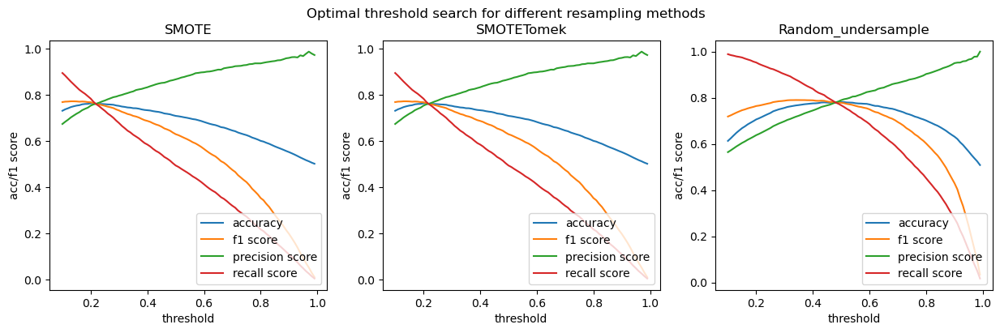

In [41]:
fig, ax = plt.subplots(ncols=3,figsize=(15,4))

for i in range(len(log_best_models)):

    y_proba = log_best_models[i].predict_proba(X_test)[:, 1]  

    thresholds = np.arange(0.1, 1.0, 0.01)
    acc_tab = []
    f1_tab = []
    recall_tab = []
    precision_tab = []

    for threshold in thresholds:
        y_pred = (y_proba > threshold).astype(int)
        acc_tab.append(accuracy_score(y_test, y_pred))
        f1_tab.append(f1_score(y_test, y_pred))
        recall_tab.append(recall_score(y_test, y_pred))
        precision_tab.append(precision_score(y_test, y_pred))
        #print(f"Threshold: {threshold}, Accuracy : {accuracy}")

    #best_threshold_index = np.argmax(np.array(recall_tab) * np.array(precision_tab))
    best_threshold_index = np.argmax(np.array(acc_tab))
    #print(f'Best threshold for {resampling_methods[i]} is ', thresholds[best_threshold_index], '. It reaches precision ', precision_tab[best_threshold_index], ' and recall ', recall_tab[best_threshold_index])
    print(f'Best threshold for {resampling_methods[i]} is ', thresholds[best_threshold_index], '. It reaches accuracy ', acc_tab[best_threshold_index])
          
    ax[i].plot(thresholds, acc_tab, label='accuracy')
    ax[i].plot(thresholds, f1_tab, label='f1 score')
    ax[i].plot(thresholds, precision_tab, label='precision score')
    ax[i].plot(thresholds, recall_tab, label='recall score ')
    ax[i].set_xlabel('threshold')
    ax[i].set_ylabel('acc/f1 score')

    ax[i].set_title(f'{resampling_methods[i]}')
    ax[i].legend(loc='lower right')

fig.suptitle('Optimal threshold search for different resampling methods')
plt.show()

Okay, nice we see that accuracy is not bad, surprisingly it reaches the highest value for the random undersample method.

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


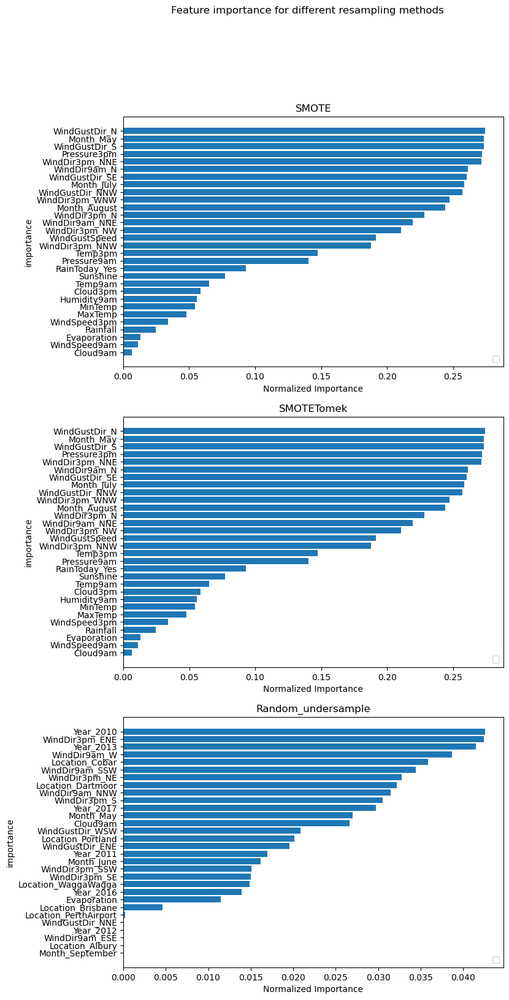

In [47]:
fig, ax = plt.subplots(nrows=3,figsize=(8,18))

for i in range(len(log_best_models)):

    feature_importance = np.abs(log_best_models[i].coef_[0])

    # Normalizing the feature importances
    feature_importance /= np.max(feature_importance)

    # Sorting indices based on feature importance
    sorted_idx = np.argsort(feature_importance)[:30]
    

    ax[i].barh(X.columns[sorted_idx], feature_importance[sorted_idx], align='center')
    ax[i].set_xlabel('Normalized Importance')

    ax[i].set_ylabel('importance')

    ax[i].set_title(f'{resampling_methods[i]}')
    ax[i].legend(loc='lower right')

fig.suptitle('Feature importance for different resampling methods')
plt.show()

We have plotted 30 most important features. We can see that Wind direction seems to be the most important feature. Summer months also play a important role. Also RainToday,Sunshine, Temperature and Pressure.

Finally lets plot ROC curve and calculate AUC

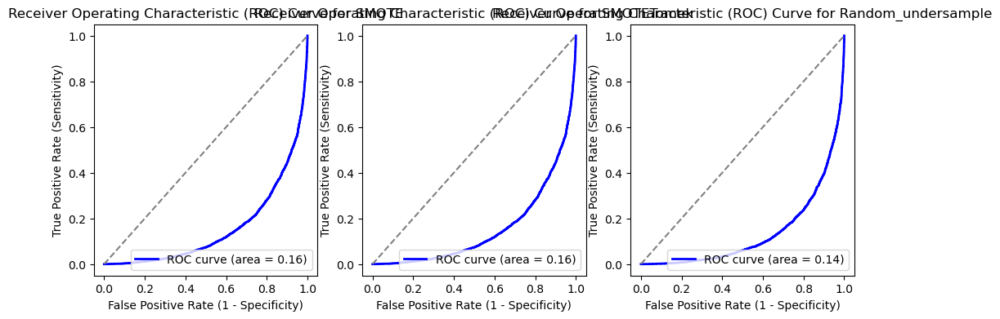

In [52]:
roc_plotting(log_best_models,X_test,y_test)

All three techniques have pretty similar outcomes. ROC curve isn't ideal, we cant get good recall while not increasing FPR significantly. 

## K-Nearest Neighbors (KNN)

In [9]:
knn_param_grid = {
    'n_neighbors': [3, 4, 5, 6]#,
    #'algorithm': ['ball_tree', 'kd_tree']
}

knn_best_models = hyperparameter_tuning(X_trains, y_trains, X_test, y_test, model_type='knn', param_grid=knn_param_grid, cv=2)

Fitting 2 folds for each of 4 candidates, totalling 8 fits
[CV] END ......................................n_neighbors=3; total time=   0.3s
[CV] END ......................................n_neighbors=3; total time=   0.2s
[CV] END ......................................n_neighbors=4; total time=   0.2s
[CV] END ......................................n_neighbors=4; total time=   0.2s
[CV] END ......................................n_neighbors=5; total time=   0.2s
[CV] END ......................................n_neighbors=5; total time=   0.2s
[CV] END ......................................n_neighbors=6; total time=   0.2s
[CV] END ......................................n_neighbors=6; total time=   0.2s
SMOTE oversampling
Classification Report:
               precision    recall  f1-score   support

           0       0.82      0.50      0.62      6263
           1       0.64      0.89      0.75      6263

    accuracy                           0.70     12526
   macro avg       0.73      0.7

In [10]:
save_models(knn_best_models,'knn')

In [15]:
knn_best_models = load_models('knn')
for i in range(len(knn_best_models)):
    pred = knn_best_models[i].predict(X_test.values)
    accuracy = accuracy_score(y_test,pred)
    print(resampling_methods[i], ' - accuracy: ', accuracy)

c:\Users\opala\miniconda3\envs\ml\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(


SMOTE  - accuracy:  0.6958326680504551


c:\Users\opala\miniconda3\envs\ml\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(


SMOTETomek  - accuracy:  0.6958326680504551


c:\Users\opala\miniconda3\envs\ml\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(


Random_undersample  - accuracy:  0.744850710522114


In [ ]:
for i in range(len(knn_best_models)):
    print(resampling_methods[i], knn_best_models[i].n_neighbors)

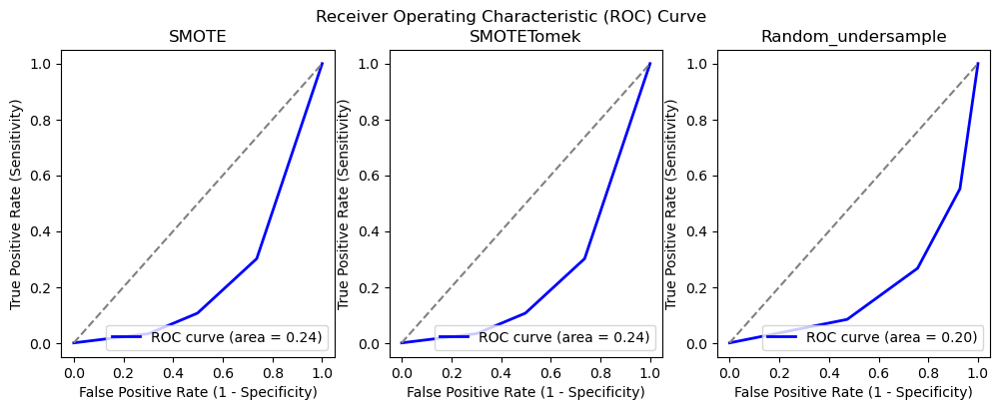

In [14]:
roc_plotting(knn_best_models,X_test.values,y_test)

Here situation is slightly better than in logistic regression but still far from good. AUC increased about 50% compared but its still not possible to get good recall while keeping FPR low.

## Naive Bayes

In [19]:
nb_param_grid = {
    'var_smoothing': [1e-9, 1e-8, 1e-7]
}

nb_best_models = hyperparameter_tuning(X_trains, y_trains, X_test, y_test, model_type='nb', param_grid=nb_param_grid, cv=5)

Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ................................var_smoothing=1e-09; total time=   1.0s
[CV] END ................................var_smoothing=1e-09; total time=   1.3s
[CV] END ................................var_smoothing=1e-09; total time=   1.0s
[CV] END ................................var_smoothing=1e-09; total time=   1.3s
[CV] END ................................var_smoothing=1e-09; total time=   0.9s
[CV] END ................................var_smoothing=1e-08; total time=   1.3s
[CV] END ................................var_smoothing=1e-08; total time=   1.1s
[CV] END ................................var_smoothing=1e-08; total time=   1.1s
[CV] END ................................var_smoothing=1e-08; total time=   0.9s
[CV] END ................................var_smoothing=1e-08; total time=   1.1s
[CV] END ................................var_smoothing=1e-07; total time=   1.3s
[CV] END ................................var_smoo

In [20]:
save_models(nb_best_models,'nb')

In [13]:
nb_best_models = load_models('nb')
for i in range(len(nb_best_models)):
    pred = nb_best_models[i].predict(X_test)
    accuracy = accuracy_score(y_test,pred)
    print(resampling_methods[i], ' - accuracy: ', accuracy)

SMOTE  - accuracy:  0.6295704933737826
SMOTETomek  - accuracy:  0.6295704933737826
Random_undersample  - accuracy:  0.673159827558678


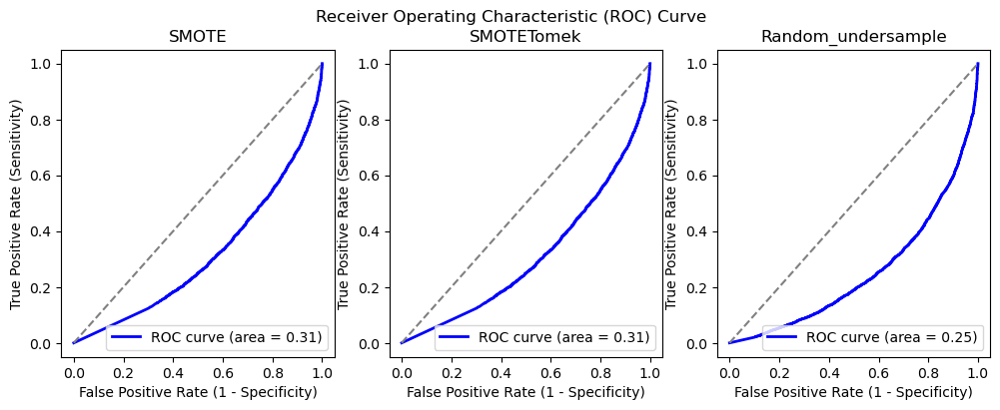

In [21]:
roc_plotting(nb_best_models,X_test,y_test)

Once again we notice some improvement in AUC, yet its still hard to choose a satisfying threshold.

## SVM

In [15]:
svc_param_grid = {
    'C': [0.1, 1, 10], 
    'penalty': ['l1', 'l2'],
    'loss': ['hinge', 'squared_hinge']
}

svc_best_models = hyperparameter_tuning(X_trains, y_trains, X_test, y_test, model_type='svc', param_grid=svc_param_grid, cv=5)

Fitting 5 folds for each of 12 candidates, totalling 60 fits
[CV] END ......................C=0.1, loss=hinge, penalty=l1; total time=   0.3s
[CV] END ......................C=0.1, loss=hinge, penalty=l1; total time=   0.3s
[CV] END ......................C=0.1, loss=hinge, penalty=l1; total time=   0.3s
[CV] END ......................C=0.1, loss=hinge, penalty=l1; total time=   0.4s
[CV] END ......................C=0.1, loss=hinge, penalty=l1; total time=   0.3s
[CV] END ......................C=0.1, loss=hinge, penalty=l2; total time=   2.0s
[CV] END ......................C=0.1, loss=hinge, penalty=l2; total time=   2.0s
[CV] END ......................C=0.1, loss=hinge, penalty=l2; total time=   2.2s
[CV] END ......................C=0.1, loss=hinge, penalty=l2; total time=   2.2s
[CV] END ......................C=0.1, loss=hinge, penalty=l2; total time=   2.3s
[CV] END ..............C=0.1, loss=squared_hinge, penalty=l1; total time=   0.3s
[CV] END ..............C=0.1, loss=squared_hinge

In [16]:
save_models(svc_best_models,'svc')

In [12]:
svc_best_models = load_models('svc')
for i in range(len(svc_best_models)):
    pred = svc_best_models[i].predict(X_test)
    accuracy = accuracy_score(y_test,pred)
    print(resampling_methods[i], ' - accuracy: ', accuracy)

SMOTE  - accuracy:  0.705572409388472
SMOTETomek  - accuracy:  0.7057320772792591
Random_undersample  - accuracy:  0.7830113364202459


Best tpr to fpr ratio:  0.757624141785087    0.2281654159348555
Best tpr to fpr ratio:  0.7593804885837458    0.22976209484272714
Best tpr to fpr ratio:  0.7868433657991378    0.21842567459683856


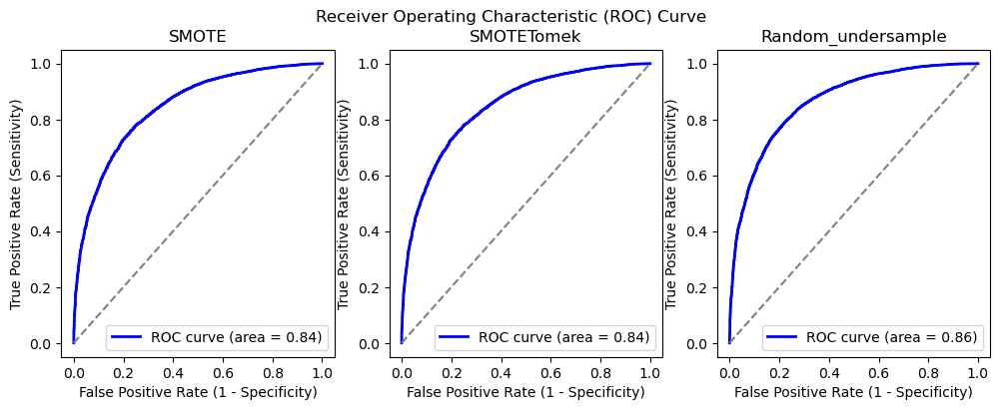

In [11]:
fig, ax = plt.subplots(ncols=3,figsize=(12,4))

for i in range(len(svc_best_models)):

    decision_scores = svc_best_models[i].decision_function(X_test)
    fpr, tpr, thresholds = roc_curve(y_test, decision_scores)

    # Calculate AUC
    roc_auc = auc(fpr, tpr)
    best_index = np.argmax(np.array(tpr)*(1-np.array(fpr)))
    print('Best tpr to fpr ratio: ', tpr[best_index], '  ', fpr[best_index])

    ax[i].plot(fpr, tpr, color='blue', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
    ax[i].plot([0, 1], [0, 1], color='gray', linestyle='--')
    ax[i].set_xlabel('False Positive Rate (1 - Specificity)')
    ax[i].set_ylabel('True Positive Rate (Sensitivity)')

    ax[i].set_title(resampling_methods[i])
    ax[i].legend(loc='lower right')

fig.suptitle('Receiver Operating Characteristic (ROC) Curve')
plt.show()

Perfect! SVC seems to be working great. We see that we are able to get recall up to almost 80% while keeping fpr rate at slightly above 20%. Opposed to rest of cases Random Undersampling seems to have done the best job here.

One thing we can surely denote is that Randomly Undersampled gave much better accuracy (around 5-8%). However it also performed worse in terms of recall/fpr trade-off. Keeping in mind that our primary goal was to maximize accuracy it seems that would be the best approach.
<br>
<br>
Another thing is that SMOTETomek hybrid doesnt seem to perform much better than the normal SMOTE method. Actually it seems that it brought practically none improvement in performance.

Best accuracies were reached for SVC and Logistic Refression (slightly worse). KNN also performed good - about 4% worse. Naive Bayes turned out to be the worst - it didnt manage to reach 70% accuracy.
<br>
In terms of recall/fpr trade-off SVC won significantly. 